<a href="https://colab.research.google.com/github/leobioinf0/feature_engineering/blob/main/S09_T01_Feature_Engineering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Feature Engineering**

Course: *Data Science amb Python*

Sprint: *9. Correlation, Feature Scaling & Feature Engineering*


Task: *S09 T01: Tasca Feature Engineering*

Date: *2021-09-28*

[Leo Madsen](https://github.com/leobioinf0)



# Nivell 1

## Exercici 1

Agafa un conjunt de dades de tema esportiu que t'agradi i normalitza els atributs categòrics en dummy. Estandaritza els atributs numèrics amb StandardScaler

In [1]:
# importing libraries
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from IPython.display import HTML
from matplotlib import animation

sns.set(style="darkgrid", rc={'figure.figsize':(12,7)})
warnings.filterwarnings('ignore')

### Load the data

In [2]:
data = pd.read_csv('https://raw.githubusercontent.com/leobioinf0/Statistics/main/athlete_events.csv', encoding='utf8',index_col='ID')
data.head()

,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
ID,,,,,,,,,,,,,,
1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


### Sellect data

- We will select records from the year 2000 and the "Summer" season.
- We will select the attributes 'Height', 'Weight', 'Age', "Sex", "Medal" and "Sport".
- We delete the records with "null values"
- From the duplicate records we will select only the first
- We set the datatypes of each attribute.

In [3]:
df = data[['Height', 'Weight', 'Age', "Sex", "Medal", "Sport","Season", "Year"]]
df = df[(df.Season=="Summer")  & (df.Year>=2000)][['Height', 'Weight', 'Age', "Sex", "Medal", "Sport"]]
df.dropna(inplace=True)
df = df[~df.index.duplicated(keep='first')]
df = df.astype({"Height":'int64', "Weight":'int64',"Age":'int64', "Sex":'category',"Medal":"category" ,"Sport":'category'})
df.reset_index(drop=True, inplace=True)
df

,Height,Weight,Age,Sex,Medal,Sport
0,198,90,21,M,Bronze,Rowing
1,194,87,30,M,Bronze,Fencing
2,165,49,21,F,Bronze,Taekwondo
3,179,80,22,F,Silver,Athletics
4,180,83,28,M,Gold,Canoeing
...,...,...,...,...,...,...
3395,173,58,25,M,Bronze,Athletics
3396,177,70,40,M,Gold,Equestrianism
3397,188,77,22,M,Silver,Swimming
3398,172,62,32,M,Bronze,Athletics


### Scalling and dummies

- In a new dataframe we scale the attributes 'Height', 'Weight' and 'Age' using the function `StandardScaler()`
- We convert the attributes 'Medal', 'Sex' and 'Sport' into dummies with `get_dummies()`

In [4]:
df0 = df.copy()
df0[['Height', 'Weight','Age']] = pd.DataFrame(StandardScaler().fit_transform(df0.loc[:,'Height':'Age']))
df0 = pd.get_dummies(df0,  
                     columns=['Medal','Sex','Sport'],
                     prefix=['med','sex','spo'])
df0.head()

,Height,Weight,Age,med_Bronze,med_Gold,med_Silver,sex_F,sex_M,spo_Archery,spo_Athletics,spo_Badminton,spo_Baseball,spo_Basketball,spo_Beach Volleyball,spo_Boxing,spo_Canoeing,spo_Cycling,spo_Diving,spo_Equestrianism,spo_Fencing,spo_Football,spo_Golf,spo_Gymnastics,spo_Handball,spo_Hockey,spo_Judo,spo_Modern Pentathlon,spo_Rhythmic Gymnastics,spo_Rowing,spo_Rugby Sevens,spo_Sailing,spo_Shooting,spo_Softball,spo_Swimming,spo_Synchronized Swimming,spo_Table Tennis,spo_Taekwondo,spo_Tennis,spo_Trampolining,spo_Triathlon,spo_Volleyball,spo_Water Polo,spo_Weightlifting,spo_Wrestling
0,1.659194,0.948834,-0.949002,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1.317445,0.764839,0.931670,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,-1.160240,-1.565756,-0.949002,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,0.035884,0.335519,-0.740039,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0.121321,0.519514,0.513743,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Exercici 2

Continua amb el conjunt de dades de tema esportiu que t'agradi i aplica l'anàlisi de components principals.

### 3D scatterplot

- We first plot the three numerical attributes on a 3D scatterplot hued by each of the categorical attributes.

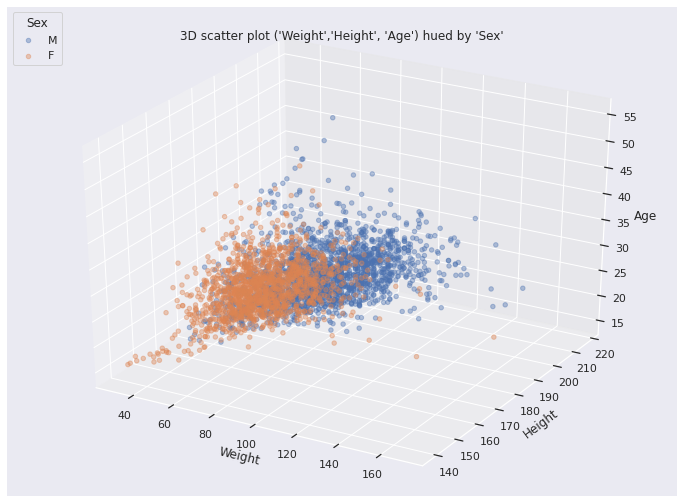

In [5]:
fig01 = plt.figure(figsize=(12,9))
ax01 = fig01.add_subplot(111, projection='3d')
for s in df.Sex.unique():
    ax01.scatter(df.Weight[df.Sex==s], df.Height[df.Sex==s], df.Age[df.Sex==s],label=s, alpha=0.4)
plt.legend(loc='upper left', title="Sex")
ax01.set(xlabel='Weight',ylabel='Height',zlabel='Age', title="3D scatter plot ('Weight','Height', 'Age') hued by 'Sex'")
plt.show()

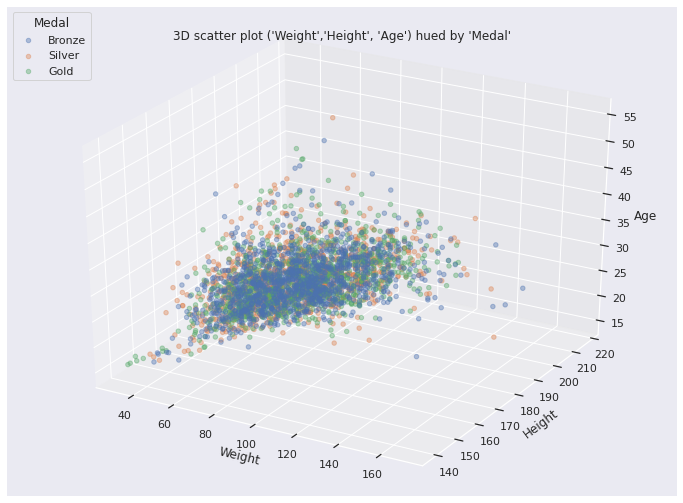

In [6]:
fig02 = plt.figure(figsize=(12,9))
ax02 = fig02.add_subplot(111, projection='3d')
for s in df.Medal.unique():
    ax02.scatter(df.Weight[df.Medal==s], df.Height[df.Medal==s], df.Age[df.Medal==s], label=s, alpha=0.4)
plt.legend(loc='upper left', title="Medal")
ax02.set(xlabel='Weight',ylabel='Height',zlabel='Age', title="3D scatter plot ('Weight','Height', 'Age') hued by 'Medal'")
plt.show()

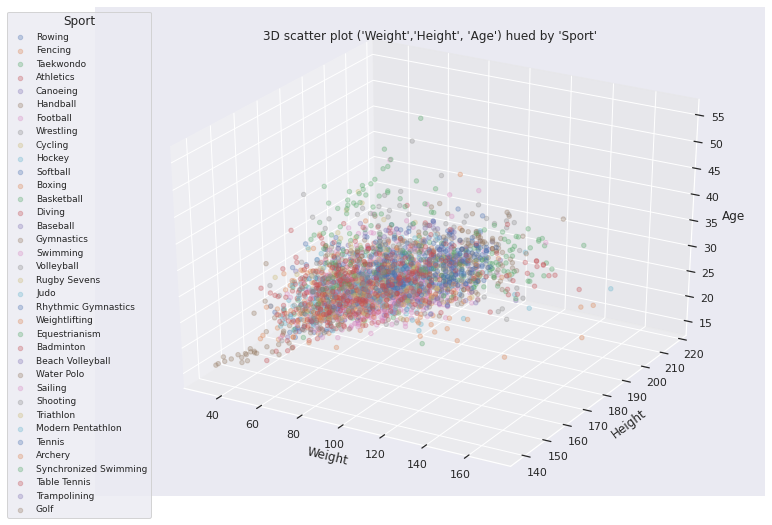

In [7]:
fig03 = plt.figure(figsize=(12,9))
ax03 = fig03.add_subplot(111, projection='3d')
for s in df.Sport.unique():
    ax03.scatter(df.Weight[df.Sport==s],df.Height[df.Sport==s],df.Age[df.Sport==s],label=s, alpha=0.3)
plt.legend(title="Sport", fontsize=9,bbox_to_anchor=(0.09, 1))
ax03.set(xlabel='Weight',ylabel='Height',zlabel='Age', title="3D scatter plot ('Weight','Height', 'Age') hued by 'Sport'")
plt.show()

- Interestingly, we can put all three 3D scatter diagrams together in the same figure for greater visual comfort.

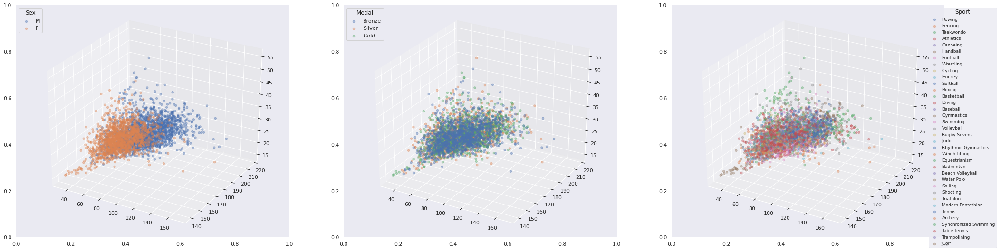

In [8]:
fig04, axs04 = plt.subplots(1,3, figsize=(35,9))
for i, attribute in enumerate(['Sex','Medal','Sport']):
    axs04[i] = fig04.add_subplot(1,3,i+1, projection='3d')
    for s in df[attribute].unique():
        axs04[i].scatter(df.Weight[df[attribute]==s], df.Height[df[attribute]==s], df.Age[df[attribute]==s],label=s, alpha=0.4)
    if attribute == "Sport":
       plt.legend(title=attribute, fontsize=9,bbox_to_anchor=(1.2, 1))
    else:
        plt.legend(loc='upper left', title=attribute)
plt.show()

### Animated 3D scatter
Even more interesting, we can animate the 3D scatter plots to see more visual information.

In [6]:
def animate(frame):
  ax01.view_init(elev=30, azim=frame)
  plt.pause(.001)
  return fig01
  
anim = animation.FuncAnimation(fig01, animate, frames=360, interval=50)
HTML(anim.to_html5_video())

In [ ]:
def animate(frame):
  ax02.view_init(elev=30, azim=frame)
  plt.pause(.001)
  return fig02
  
anim = animation.FuncAnimation(fig02, animate, frames=360, interval=50)
HTML(anim.to_html5_video())

In [ ]:
def animate(frame):
  ax03.view_init(elev=30, azim=frame)
  plt.pause(.001)
  return fig03
  
anim = animation.FuncAnimation(fig03, animate, frames=360, interval=50)
HTML(anim.to_html5_video())

### 2 comp. PCA ('Weight', 'Height', 'Age')

- Two-component PCA of the three numeric attributes

In [9]:
df1= df.copy()
pca_2_n_SS = PCA(n_components=2)
PC_2_n_SS = pca_2_n_SS.fit_transform(df0.loc[:,'Height':'Age'])
df1[['PC1', 'PC2']] = PC_2_n_SS
df1.head()

,Height,Weight,Age,Sex,Medal,Sport,PC1,PC2
0,198,90,21,M,Bronze,Rowing,1.592681,-1.344045
1,194,87,30,M,Bronze,Fencing,1.637847,0.575301
2,165,49,21,F,Bronze,Taekwondo,-2.088523,-0.518558
3,179,80,22,F,Silver,Athletics,0.096768,-0.771031
4,180,83,28,M,Gold,Canoeing,0.554790,0.413346


#### 2 comp. PCA scatter plot

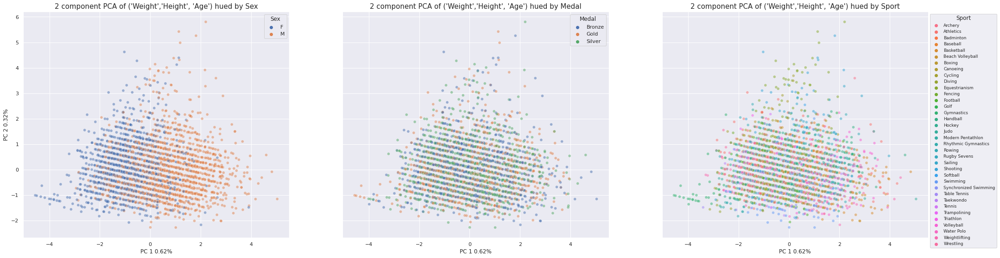

In [10]:
fig05, axs05 = plt.subplots(1,3, figsize=(35,9), sharey=True)

for i, attribute in enumerate(['Sex','Medal','Sport']):
    sns.scatterplot(data=df1, x="PC1", y="PC2", hue=attribute,alpha=.5, ax=axs05[i])
    axs05[i].set(xlabel='PC 1 '+str(round(pca_2_n_SS.explained_variance_ratio_[0], 2))+"%",
           ylabel='PC 2 '+str(round(pca_2_n_SS.explained_variance_ratio_[1], 2))+"%")
    axs05[i].set_title("2 component PCA of ('Weight','Height', 'Age') hued by " + attribute, fontsize = 15)
    if attribute == "Sport":
       plt.legend(title=attribute, fontsize=9,bbox_to_anchor=(1, 1))
plt.show()

#### Explained variance

Explained variance by the two components


In [11]:
pca_2_n_SS.explained_variance_ratio_.round(2)

array([0.62, 0.32])

The first component explains 62% of the variance and the second component explains 32%

In [12]:
pca_2_n_SS.explained_variance_ratio_.sum().round(2)

0.94

The two components explain 94% of the variance of the three numerical attributes

### 3 comp. PCA ('Weight','Height', 'Age')

Three components PCA of the three numerical attributes

In [13]:
df2= df.copy()
pca_3 = PCA(n_components=3)
PC_3 = pca_3.fit_transform(df0.loc[:,'Height':'Age'])
df2[['PC1', 'PC2', 'PC3']] = PC_3
df2.head()

,Height,Weight,Age,Sex,Medal,Sport,PC1,PC2,PC3
0,198,90,21,M,Bronze,Rowing,1.592681,-1.344045,-0.459048
1,194,87,30,M,Bronze,Fencing,1.637847,0.575301,-0.418493
2,165,49,21,F,Bronze,Taekwondo,-2.088523,-0.518558,-0.259853
3,179,80,22,F,Silver,Athletics,0.096768,-0.771031,0.240134
4,180,83,28,M,Gold,Canoeing,0.554790,0.413346,0.264383


#### 3 comp. PCA 3D scatter plot

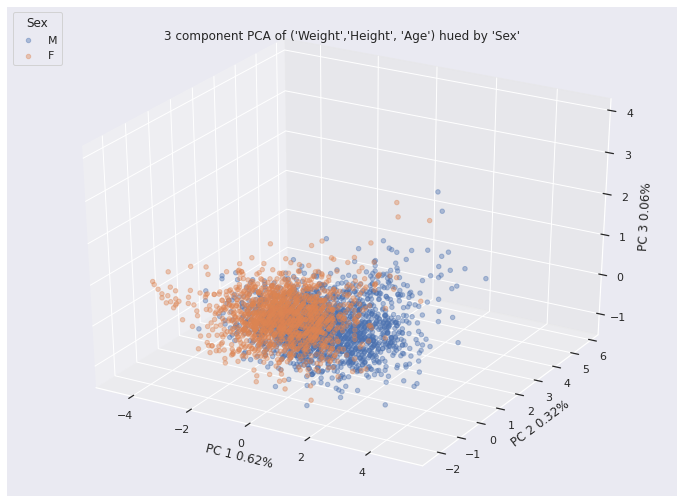

In [14]:
fig06 = plt.figure(figsize=(12,9))
ax06 = fig06.add_subplot(111, projection='3d')
for s in df2.Sex.unique():
    ax06.scatter(df2.PC1[df2.Sex==s], df2.PC2[df2.Sex==s], df2.PC3[df2.Sex==s],label=s, alpha=0.4)
plt.legend(loc='upper left', title="Sex")
ax06.set(xlabel='PC 1 '+str(round(pca_3.explained_variance_ratio_[0], 2))+"%",
          ylabel='PC 2 '+str(round(pca_3.explained_variance_ratio_[1], 2))+"%",
          zlabel='PC 3 '+str(round(pca_3.explained_variance_ratio_[2], 2))+"%",
          title="3 component PCA of ('Weight','Height', 'Age') hued by 'Sex'" )
plt.show()

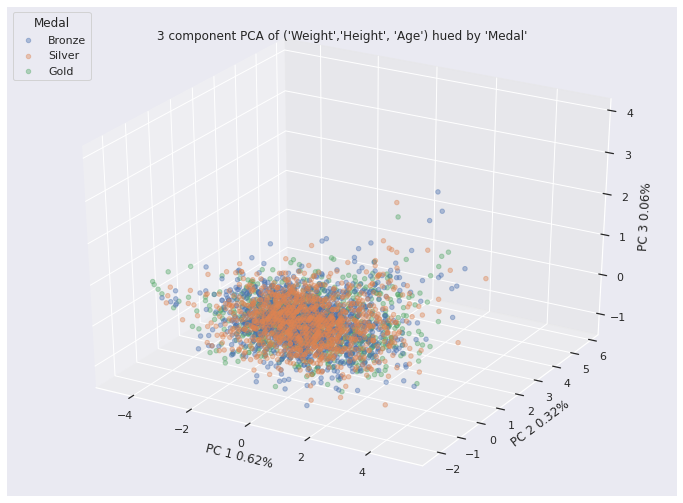

In [15]:
fig07 = plt.figure(figsize=(12,9))
ax07 = fig07.add_subplot(111, projection='3d')
for s in df2.Medal.unique():
    ax07.scatter(df2.PC1[df2.Medal==s], df2.PC2[df2.Medal==s], df2.PC3[df2.Medal==s],label=s, alpha=0.4)
plt.legend(loc='upper left', title="Medal")
ax07.set(xlabel='PC 1 '+str(round(pca_3.explained_variance_ratio_[0], 2))+"%",
          ylabel='PC 2 '+str(round(pca_3.explained_variance_ratio_[1], 2))+"%",
          zlabel='PC 3 '+str(round(pca_3.explained_variance_ratio_[2], 2))+"%",
          title="3 component PCA of ('Weight','Height', 'Age') hued by 'Medal'" )
plt.show()

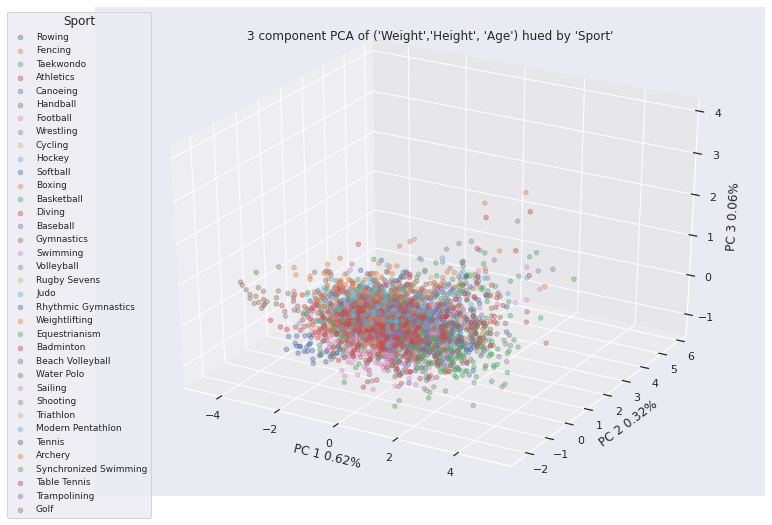

In [16]:
fig08 = plt.figure(figsize=(12,9))
ax08 = fig08.add_subplot(111, projection='3d')
for s in df2.Sport.unique():
    ax08.scatter(df2.PC1[df2.Sport==s], df2.PC2[df2.Sport==s], df2.PC3[df2.Sport==s],label=s, alpha=0.4)
plt.legend(loc='upper left', title="Sport")
ax08.set(xlabel='PC 1 '+str(round(pca_3.explained_variance_ratio_[0], 2))+"%",
          ylabel='PC 2 '+str(round(pca_3.explained_variance_ratio_[1], 2))+"%",
          zlabel='PC 3 '+str(round(pca_3.explained_variance_ratio_[2], 2))+"%",
          title="3 component PCA of ('Weight','Height', 'Age') hued by 'Sport'" )
plt.legend(title="Sport", fontsize=9,bbox_to_anchor=(0.09, 1))
plt.show()

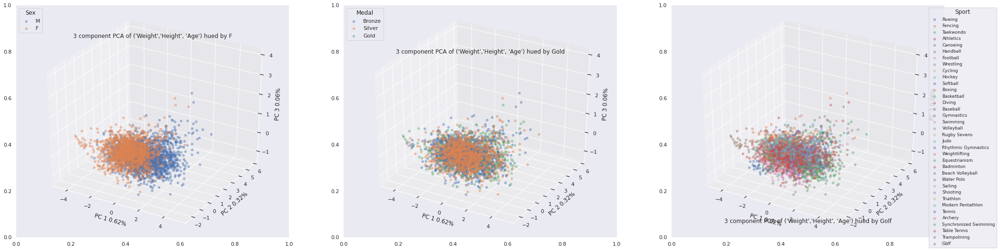

In [17]:
fig09, axs09 = plt.subplots(1,3, figsize=(35,9))
for i, attribute in enumerate(['Sex','Medal','Sport']):
    axs09[i] = fig09.add_subplot(1,3,i+1, projection='3d')
    for s in df2[attribute].unique():
        axs09[i].scatter(df2.PC1[df2[attribute]==s], df2.PC2[df2[attribute]==s], df2.PC3[df2[attribute]==s],label=s, alpha=0.4)
        axs09[i].set(xlabel='PC 1 '+str(round(pca_3.explained_variance_ratio_[0], 2))+"%",
          ylabel='PC 2 '+str(round(pca_3.explained_variance_ratio_[1], 2))+"%",
          zlabel='PC 3 '+str(round(pca_3.explained_variance_ratio_[2], 2))+"%",
          title="3 component PCA of ('Weight','Height', 'Age') hued by " + s )
    if attribute == "Sport":
       plt.legend(title=attribute, fontsize=9,bbox_to_anchor=(1.2, 1))
    else:
        plt.legend(loc='upper left', title=attribute)
    
plt.show()


In [ ]:
def animate(frame):
  ax06.view_init(elev=30, azim=frame)
  plt.pause(.001)
  return fig06
  
anim = animation.FuncAnimation(fig06, animate, frames=360, interval=50)
HTML(anim.to_html5_video())

In [ ]:
def animate(frame):
  ax07.view_init(elev=30, azim=frame)
  plt.pause(.001)
  return fig07
  
anim = animation.FuncAnimation(fig07, animate, frames=360, interval=50)
HTML(anim.to_html5_video())

In [ ]:
def animate(frame):
  ax08.view_init(elev=30, azim=frame)
  plt.pause(.001)
  return fig08
  
anim = animation.FuncAnimation(fig08, animate, frames=360, interval=50)
HTML(anim.to_html5_video())

#### Explained variance

Explained variance by the three components:


In [18]:
pca_3.explained_variance_ratio_.round(2)

array([0.62, 0.32, 0.06])

The first component explains 62% of the variance, the second component explains 32%, and the third component explains 6%.

In [19]:
pca_3.explained_variance_ratio_.sum()

1.0

The three components explain 100% of the variance of the three numerical attributes

### 2 comp. PCA ('Weight','Height', 'Age') and ('Sex', 'Medal', 'Sport')

2 component PCA of 3 numeric attributes ('Weight','Height', 'Age') and 3 categorical ('Sex', 'Medal', 'Sport') converted into dummies. StandardScaler

In [20]:
df3= df.copy()
pca_2_nd_SS = PCA(n_components=2)
PC_2_nd_SS = pca_2_nd_SS.fit_transform(pd.DataFrame(StandardScaler().fit_transform(df0),  columns=df0.columns))
df3[['PC1', 'PC2']] = PC_2_nd_SS
df3.head()

,Height,Weight,Age,Sex,Medal,Sport,PC1,PC2
0,198,90,21,M,Bronze,Rowing,-2.241494,0.940724
1,194,87,30,M,Bronze,Fencing,-1.869640,0.823050
2,165,49,21,F,Bronze,Taekwondo,2.730292,1.808438
3,179,80,22,F,Silver,Athletics,1.216324,-1.199557
4,180,83,28,M,Gold,Canoeing,-1.482053,-0.075260


#### 2 comp. PCA 3D scatter plot

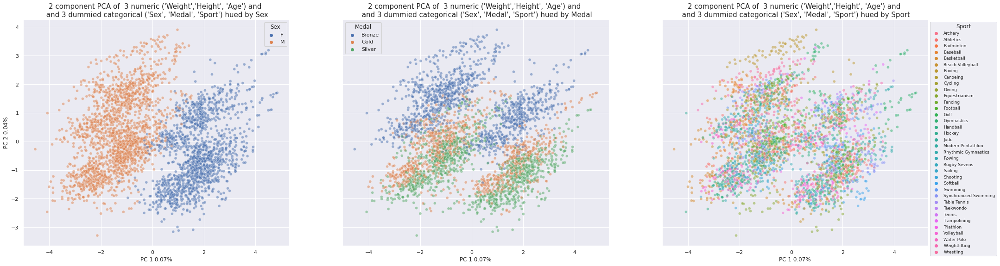

In [21]:
fig10, axs10 = plt.subplots(1,3, figsize=(35,9), sharey=True)

for i, attribute in enumerate(['Sex','Medal','Sport']):
    sns.scatterplot(data=df3, x="PC1", y="PC2", hue=attribute,alpha=.5, ax=axs10[i])
    axs10[i].set(xlabel='PC 1 '+str(round(pca_2_nd_SS.explained_variance_ratio_[0], 2))+"%",
           ylabel='PC 2 '+str(round(pca_2_nd_SS.explained_variance_ratio_[1], 2))+"%")
    axs10[i].set_title("2 component PCA of  3 numeric ('Weight','Height', 'Age') and \n and 3 dummied categorical ('Sex', 'Medal', 'Sport') hued by " + attribute, fontsize = 15)   
    if attribute == "Sport":
       plt.legend(title=attribute, fontsize=9,bbox_to_anchor=(1, 1))
plt.show()

#### Explained variance 

Explained variance by the two components:



In [22]:
pca_2_nd_SS.explained_variance_ratio_.round(2)

array([0.07, 0.04])

The first component explains 7% of the variance and the second component explains 4%.

In [23]:
pca_2_nd_SS.explained_variance_ratio_.sum()

0.11070301936583915

The two components explain 11% of the variance of the three numeric attributes and dummies.

We conclude that using dummies in a PCA is not good practice.

## Exercici 3

Continua amb el conjunt de dades de tema esportiu que t'agradi i normalitza les dades tenint en compte els outliers.

In [117]:
df4 = df.copy()

Depending on the distribution of the data, we use different methods to detect and eliminate outliers.

In [118]:
for attr in ['Height', 'Weight', 'Age']:
    k2, p = stats.normaltest(df4[attr])
    alpha = 1e-3
    if p < alpha:  # null hypothesis: x comes from a normal distribution
        print("The null hypothesis ({}~N(𝜇={},𝜎={})) can be rejected".format(attr, round(df4[attr].mean(),1), round(np.std(df4[attr]),1)))
    else:
        print("The null hypothesis ({}~N(𝜇={},𝜎={})) cannot be rejected".format(attr, round(df4[attr].mean(),1), round(np.std(df4[attr]),1)))

The null hypothesis (Height~N(𝜇=178.6,𝜎=11.7)) cannot be rejected
The null hypothesis (Weight~N(𝜇=74.5,𝜎=16.3)) can be rejected
The null hypothesis (Age~N(𝜇=25.5,𝜎=4.8)) can be rejected


- For Normal distributions ("Height")  we use empirical relations of Normal distribution. The data points which fall below $\mu-3\sigma$ or above $\mu+3\sigma$ are outliers. Where $\mu$ and $\sigma$ are the average value and standard deviation of a particular column.

- For Skewed distributions ('Weight' and 'Age') we use Inter-Quartile Range (IQR) proximity rule. The data points which fall below $Q_1 – 1.5 IQR$ or above $Q_3 + 1.5 IQR$ are outliers. Where $Q_1$ and $Q_3$ are the 25th and 75th percentile of the dataset respectively, and $IQR$ represents the inter-quartile range and given by $Q_3 – Q_1$.

### Compute the limits

We obtain the lower and upper limits of each variable

In [119]:
low_lim_Height = df4.Height.mean() - 3*df4.Height.std()
up_lim_Height = df4.Height.mean() + 3*df4.Height.std()

low_lim_Weight = df4.Weight.quantile(.25) - 1.5*(df4.Weight.quantile(.75)-df4.Weight.quantile(.25))
up_lim_Weight = df4.Weight.quantile(.75) + 1.5*(df4.Weight.quantile(.75)-df4.Weight.quantile(.25))

low_lim_Age = df4.Age.quantile(.25) - 1.5*(df4.Age.quantile(.75)-df4.Age.quantile(.25))
up_lim_Age = df4.Age.quantile(.75) + 1.5*(df4.Age.quantile(.75)-df4.Age.quantile(.25))

### Visualization

We visualize the outliers in a distribution plot and in a boxplot in which we will draw both limits.


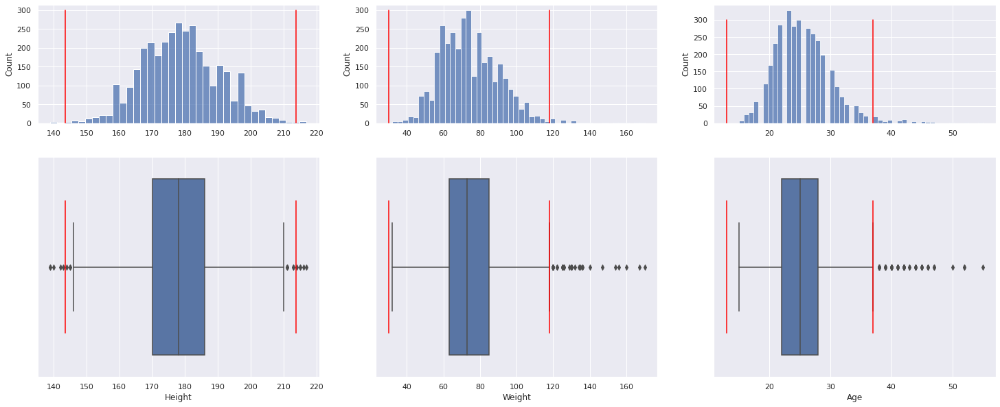

In [120]:
fig, axs = plt.subplots(2,3, figsize=(25,10), gridspec_kw={"height_ratios": (.35, .65)})

sns.histplot(df4['Height'], ax=axs[0][0])
axs[0][0].plot([low_lim_Height, low_lim_Height], [0, 300], color='red')
axs[0][0].plot([up_lim_Height, up_lim_Height], [0, 300], color='red')
axs[0][0].set(xlabel='')
sns.boxplot(df4["Height"], ax=axs[1][0])
axs[1][0].plot([low_lim_Height, low_lim_Height], [-.3, .3], color='red')
axs[1][0].plot([up_lim_Height, up_lim_Height], [-.3, .3], color='red')

sns.histplot(df4['Weight'], ax=axs[0][1])
axs[0][1].plot([low_lim_Weight, low_lim_Weight], [0, 300], color='red')
axs[0][1].plot([up_lim_Weight, up_lim_Weight], [0, 300], color='red')
axs[0][1].set(xlabel='')
sns.boxplot(df4["Weight"], ax=axs[1][1])
axs[1][1].plot([low_lim_Weight, low_lim_Weight], [-.3, .3], color='red')
axs[1][1].plot([up_lim_Weight, up_lim_Weight], [-.3, .3], color='red')

sns.histplot(df4['Age'], ax=axs[0][2])
axs[0][2].plot([low_lim_Age, low_lim_Age], [0, 300], color='red')
axs[0][2].plot([up_lim_Age, up_lim_Age], [0, 300], color='red')
axs[0][2].set(xlabel='')
sns.boxplot(df4["Age"], ax=axs[1][2])
axs[1][2].plot([low_lim_Age, low_lim_Age], [-.3, .3], color='red')
axs[1][2].plot([up_lim_Age, up_lim_Age], [-.3, .3], color='red')

### Remove outliers

In [121]:
df4 = df4[(df4.Height > low_lim_Height) & 
        (df4.Height < up_lim_Height) & 
        (df4.Weight > low_lim_Weight) & 
        (df4.Weight < up_lim_Weight) & 
        (df4.Age > low_lim_Age) & 
        (df4.Age < up_lim_Age)]

Visually check that there are no records beyond the limits

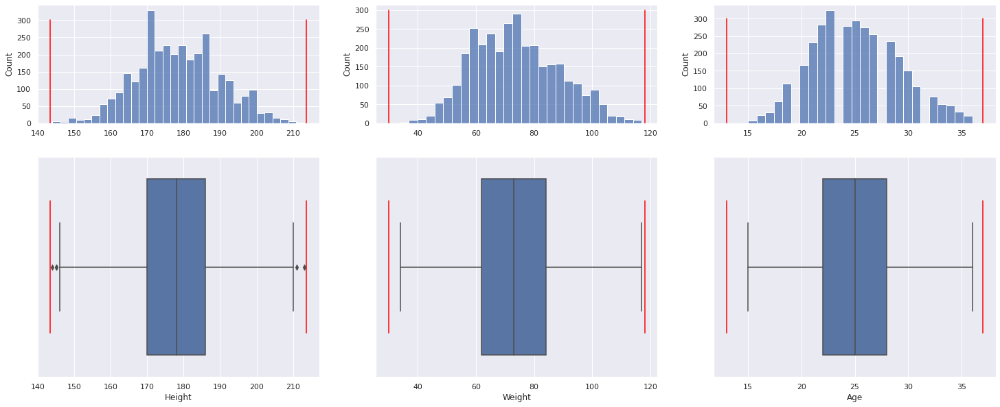

In [122]:
fig, axs = plt.subplots(2,3, figsize=(25,10), gridspec_kw={"height_ratios": (.35, .65)})

sns.histplot(df4['Height'], ax=axs[0][0])
axs[0][0].plot([low_lim_Height, low_lim_Height], [0, 300], color='red')
axs[0][0].plot([up_lim_Height, up_lim_Height], [0, 300], color='red')
axs[0][0].set(xlabel='')
sns.boxplot(df4["Height"], ax=axs[1][0])
axs[1][0].plot([low_lim_Height, low_lim_Height], [-.3, .3], color='red')
axs[1][0].plot([up_lim_Height, up_lim_Height], [-.3, .3], color='red')

sns.histplot(df4['Weight'], ax=axs[0][1])
axs[0][1].plot([low_lim_Weight, low_lim_Weight], [0, 300], color='red')
axs[0][1].plot([up_lim_Weight, up_lim_Weight], [0, 300], color='red')
axs[0][1].set(xlabel='')
sns.boxplot(df4["Weight"], ax=axs[1][1])
axs[1][1].plot([low_lim_Weight, low_lim_Weight], [-.3, .3], color='red')
axs[1][1].plot([up_lim_Weight, up_lim_Weight], [-.3, .3], color='red')

sns.histplot(df4['Age'], ax=axs[0][2])
axs[0][2].plot([low_lim_Age, low_lim_Age], [0, 300], color='red')
axs[0][2].plot([up_lim_Age, up_lim_Age], [0, 300], color='red')
axs[0][2].set(xlabel='')
sns.boxplot(df4["Age"], ax=axs[1][2])
axs[1][2].plot([low_lim_Age, low_lim_Age], [-.3, .3], color='red')
axs[1][2].plot([up_lim_Age, up_lim_Age], [-.3, .3], color='red')

Now that we have eliminated the outliers we can do the normalization with `StandardScaler()`

In [123]:
df4[['Height', 'Weight','Age']] = pd.DataFrame(StandardScaler().fit_transform(df4.loc[:,'Height':'Age']))
df4.head()

,Height,Weight,Age,Sex,Medal,Sport
0,1.707493,1.081542,-1.011014,M,Bronze,Rowing
1,1.358964,0.881444,1.185326,M,Bronze,Fencing
2,-1.167871,-1.653127,-1.011014,F,Bronze,Taekwondo
3,0.051980,0.414550,-0.766976,F,Silver,Athletics
4,0.139112,0.614647,0.697251,M,Gold,Canoeing
